In [4]:
import pandas as pd

df = pd.read_csv("uber.csv")

df["Date/Time"] = pd.to_datetime(df["Date/Time"])
df["weekday"] = df["Date/Time"].dt.day_name()
df["day"] = df["Date/Time"].dt.day
df["minute"] = df["Date/Time"].dt.minute
df["month"] = df["Date/Time"].dt.month
df["hour"] = df["Date/Time"].dt.hour
df["year"] = df["Date/Time"].dt.year

df




,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour,year
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0,2014
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0,2014
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0,2014
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0,2014
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0,2014
...,...,...,...,...,...,...,...,...,...,...
924921,2014-09-16 12:56:00,40.6746,-73.9722,B02764,Tuesday,16,56,9,12,2014
924922,2014-09-16 12:56:00,40.8900,-73.9055,B02764,Tuesday,16,56,9,12,2014
924923,2014-09-16 12:56:00,40.7665,-73.9863,B02764,Tuesday,16,56,9,12,2014
924924,2014-09-16 12:57:00,40.7606,-73.9749,B02764,Tuesday,16,57,9,12,2014


In [5]:
def count_rows(rows):
    return len(rows) # untuk mengecek jumlah baris

by_cross = df.groupby(["weekday", "hour"]).apply(count_rows)
by_cross

C:\Users\HP\AppData\Local\Temp\ipykernel_9096\113071917.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_cross = df.groupby(["weekday", "hour"]).apply(count_rows)


weekday    hour
Friday     0       2270
           1       1365
           2        911
           3       1199
           4       1660
                   ... 
Wednesday  19      8351
           20      8250
           21      7205
           22      5619
           23      3116
Length: 168, dtype: int64

In [6]:
def stok(kuantitas): # elif untuk kondisi kedua
    if kuantitas > 5:
        return "stok banyak"
    else:
        return "stok sedikit"

data = pd.DataFrame({
    "produk" : ["a", "b", "c"],
    "quantity" : [10,5,8],
    "harga" : [20000, 30000, 40000]
})

data["kondisi stok"] = data["quantity"].apply(stok) # apply untuk mengisi kolom baru
data

,produk,quantity,harga,kondisi stok
0,a,10,20000,stok banyak
1,b,5,30000,stok sedikit
2,c,8,40000,stok banyak


In [7]:
pivot = by_cross.unstack() # merubah group by menjadi pivot
group = pivot.stack() # merubah pivot table menjadi group by
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,2270,1365,911,1199,1660,2848,4703,6133,6150,5080,...,6651,7855,8824,10011,10970,10490,9268,9721,9670,8387
Monday,1741,1129,920,1661,2287,3599,5163,6646,6650,5339,...,6480,7614,8714,9001,8737,7980,7581,6361,4675,2675
Saturday,6146,4126,2589,1762,1273,1374,1854,2491,3281,3863,...,7862,8877,9386,9798,10522,10241,8755,9558,9962,9237
Sunday,7159,5148,3299,2054,1312,1429,1520,2041,2806,3543,...,5995,6417,6928,6663,6417,5747,5326,4609,3693,2097
Thursday,1588,939,639,988,1568,2469,5033,7019,6884,5668,...,6739,8070,9170,10146,10604,9875,9102,8883,7107,4641
Tuesday,1265,702,546,1134,1922,3863,6830,8755,8699,6570,...,7356,8670,9805,10889,10616,9640,9029,7875,5714,2658
Wednesday,1335,805,531,872,1466,2884,5192,6453,6122,4908,...,6211,7592,8581,9276,9214,8351,8250,7205,5619,3116


In [8]:
group

weekday    hour
Friday     0       2270
           1       1365
           2        911
           3       1199
           4       1660
                   ... 
Wednesday  19      8351
           20      8250
           21      7205
           22      5619
           23      3116
Length: 168, dtype: int64

<Axes: xlabel='hour', ylabel='weekday'>

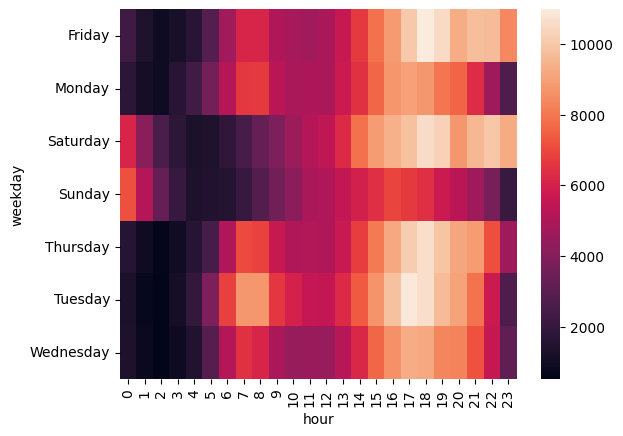

In [9]:
import seaborn as sns

sns.heatmap(pivot, annot=False) #annot untuk menampilkan angka (True angkanya tampil di heatmap, False sebaliknya)

<Axes: xlabel='hour', ylabel='weekday'>

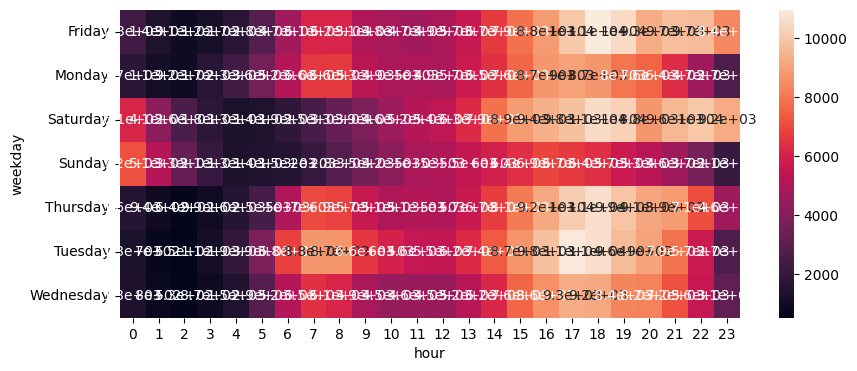

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
sns.heatmap(pivot, annot=True)

C:\Users\HP\AppData\Local\Temp\ipykernel_9096\2842067986.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_day = df.groupby(["day", "month"]).apply(count_rows)


<Axes: xlabel='month', ylabel='day'>

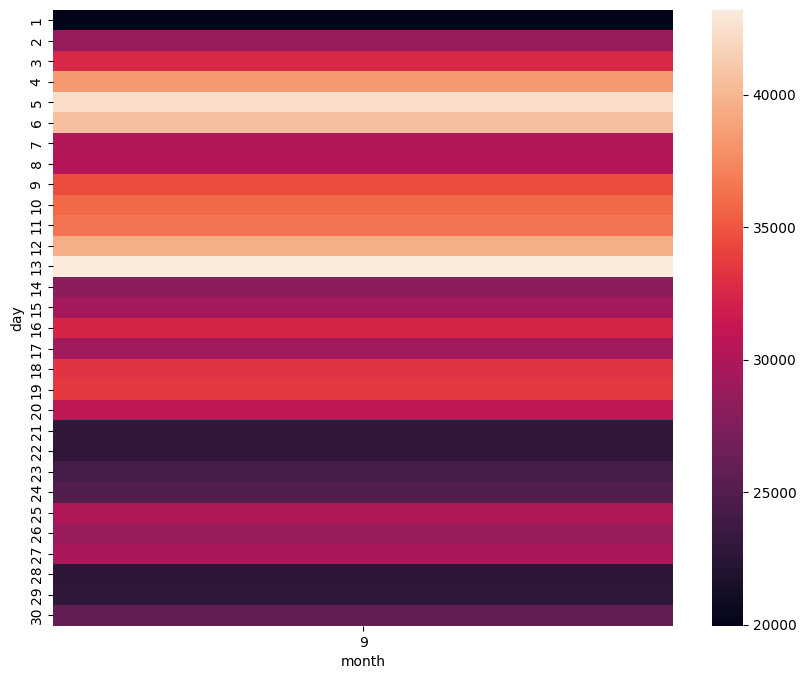

In [11]:
def count_rows(rows):
    return len(rows) 

by_day = df.groupby(["day", "month"]).apply(count_rows)
pivot_day = by_day.unstack()

plt.figure(figsize=(10,8))
sns.heatmap(pivot_day)

C:\Users\HP\AppData\Local\Temp\ipykernel_9096\3175544854.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_month = df[df["month"] == 9].groupby(["weekday", "month"]).apply(count_rows)


<Axes: xlabel='month', ylabel='weekday'>

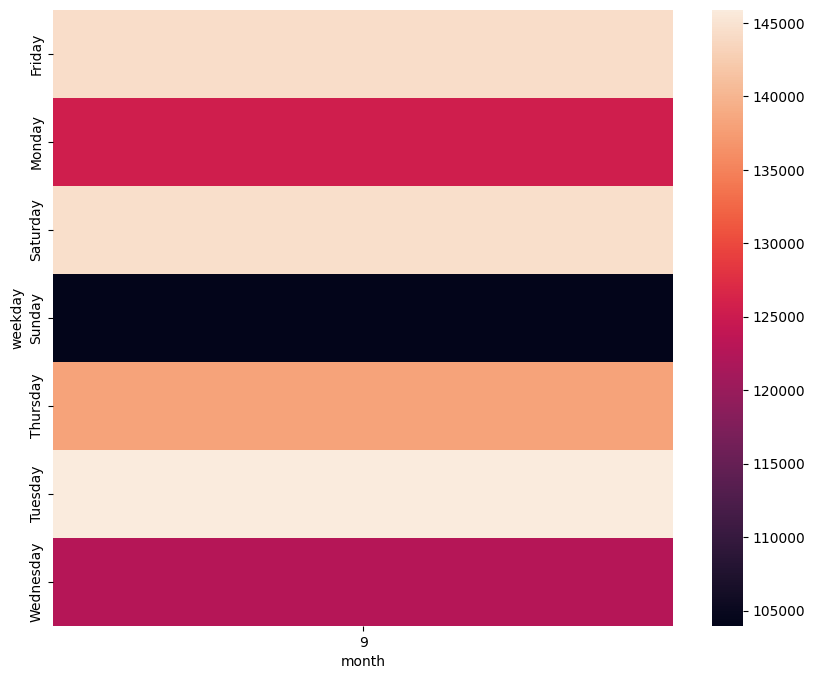

In [12]:
def count_rows(rows):
    return len(rows) # double df itu untuk mengambil data tertentu dalam 1 kolom

by_month = df[df["month"] == 9].groupby(["weekday", "month"]).apply(count_rows)
pivot_month = by_month.unstack()

plt.figure(figsize=(10,8))
sns.heatmap(pivot_month)

In [13]:
data_peta = df.groupby(["Lat", "Lon"])["weekday"].count().reset_index() # reset_index untuk mengubah groupby menjadi data frame yang memiliki index setiap row
data_peta_reset = data_peta.reset_index()
data_peta_reset

,index,Lat,Lon,weekday
0,0,39.9897,-74.1423,1
1,1,40.0580,-74.0847,1
2,2,40.0794,-74.0456,1
3,3,40.0972,-74.0877,1
4,4,40.1122,-74.0480,1
...,...,...,...,...
284686,284686,41.2759,-73.7017,1
284687,284687,41.2890,-73.7031,1
284688,284688,41.3043,-73.8912,1
284689,284689,41.3183,-74.1240,2


In [14]:
import folium
from folium.plugins import HeatMap

basemap = folium.Map()

HeatMap(data_peta_reset).add_to(basemap)

basemap

ASSIGNMENT

Analisa 1

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [16]:
data_uber2015 = pd.read_csv('uber-raw-data-janjune-15.csv')
data_uber2015.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [17]:
data_uber2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   Dispatching_base_num  object
 1   Pickup_date           object
 2   Affiliated_base_num   object
 3   locationID            int64 
dtypes: int64(1), object(3)
memory usage: 435.5+ MB


In [18]:
data_uber2015.isnull().sum()

Dispatching_base_num         0
Pickup_date                  0
Affiliated_base_num     162195
locationID                   0
dtype: int64

In [19]:
data_uber2015.fillna('No Affiliate', inplace = True)
data_uber2015.isnull().sum()

Dispatching_base_num    0
Pickup_date             0
Affiliated_base_num     0
locationID              0
dtype: int64

1

In [20]:
print('Tanggal pickup date terkecil: ', data_uber2015['Pickup_date'].min())

Tanggal pickup date terkecil:  2015-01-01 00:00:05


2

In [21]:
print('Tanggal pickup date terbesar: ', data_uber2015['Pickup_date'].max())


Tanggal pickup date terbesar:  2015-06-30 23:59:00


3

In [22]:
data_uber2015['Pickup_date'] = pd.to_datetime(data_uber2015['Pickup_date'])

data_uber2015['nama_hari'] = data_uber2015['Pickup_date'].dt.day_name()
data_uber2015['bulan'] = data_uber2015['Pickup_date'].dt.month
data_uber2015['tanggal'] = data_uber2015['Pickup_date'].dt.day
data_uber2015['jam'] = data_uber2015['Pickup_date'].dt.hour
data_uber2015['menit'] = data_uber2015['Pickup_date'].dt.minute
data_uber2015['detik'] = data_uber2015['Pickup_date'].dt.second

data_uber2015.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
nama_hari                       object
bulan                            int32
tanggal                          int32
jam                              int32
menit                            int32
detik                            int32
dtype: object

In [23]:
data_uber2015.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,nama_hari,bulan,tanggal,jam,menit,detik
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,5,17,9,47,0
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,5,17,9,47,0
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,5,17,9,47,0
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,5,17,9,47,0
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,5,17,9,47,0


4

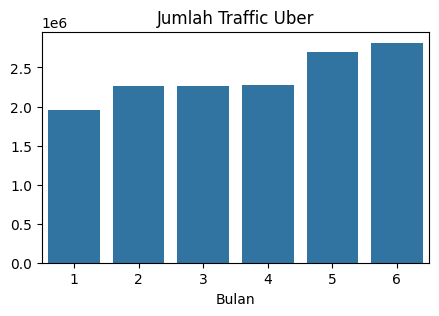

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

uber_perbulan = data_uber2015.groupby('bulan')['bulan'].count() 

plt.figure(figsize=[5,3])
sns.barplot(x = uber_perbulan.index, y = uber_perbulan.values)
plt.xlabel('Bulan')
plt.title('Jumlah Traffic Uber')
plt.show()

5

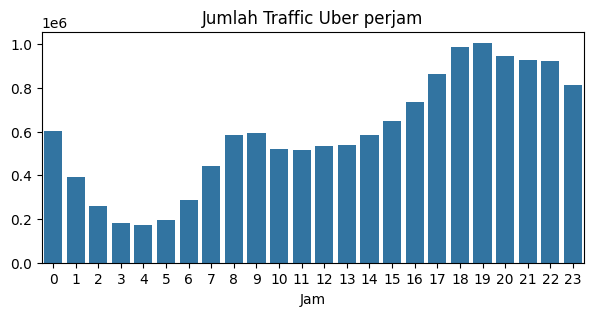

In [25]:
uber_perjam = data_uber2015.groupby('jam')['jam'].count() 

plt.figure(figsize=[7,3])
sns.barplot(x = uber_perjam.index, y = uber_perjam.values)
plt.xlabel('Jam')
plt.title('Jumlah Traffic Uber perjam')
plt.show()

6

In [ ]:
plt.figure(figsize=(10,8))
sns.pointplot(x='jam', y='locationID', hue='nama_hari', data = data_uber2015)
set_title('perbedaan pola traffic uber per jam tiap harinya')

Analisa 2

1

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

data_uberFOIL = pd.read_csv('Uber-Jan-Feb-FOIL.csv')
data_uberFOIL.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [2]:
data_uberFOIL.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354 entries, 0 to 353
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   dispatching_base_number  354 non-null    object
 1   date                     354 non-null    object
 2   active_vehicles          354 non-null    int64 
 3   trips                    354 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 11.2+ KB


In [3]:
data_uberFOIL['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

Text(0, 0.5, 'Number of Active Vehicles')

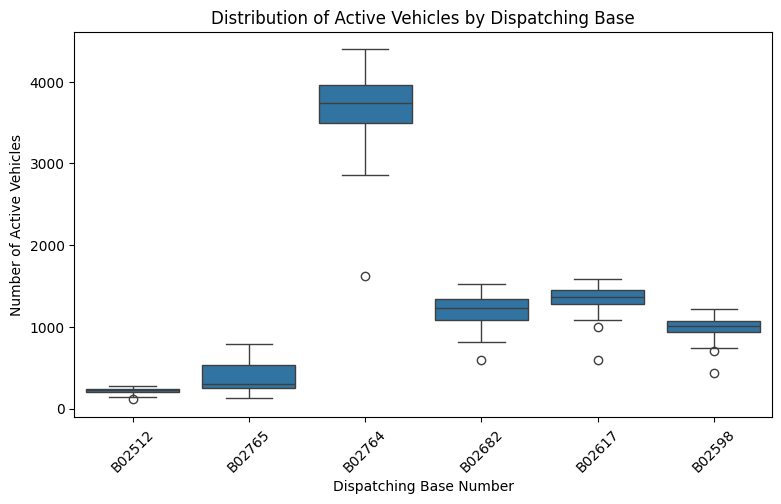

In [4]:
plt.figure(figsize=(9,5))

sns.boxplot(x="dispatching_base_number", y="active_vehicles", data= data_uberFOIL)
plt.xticks(rotation=45)
plt.title("Distribution of Active Vehicles by Dispatching Base")
plt.xlabel("Dispatching Base Number")
plt.ylabel("Number of Active Vehicles")

2

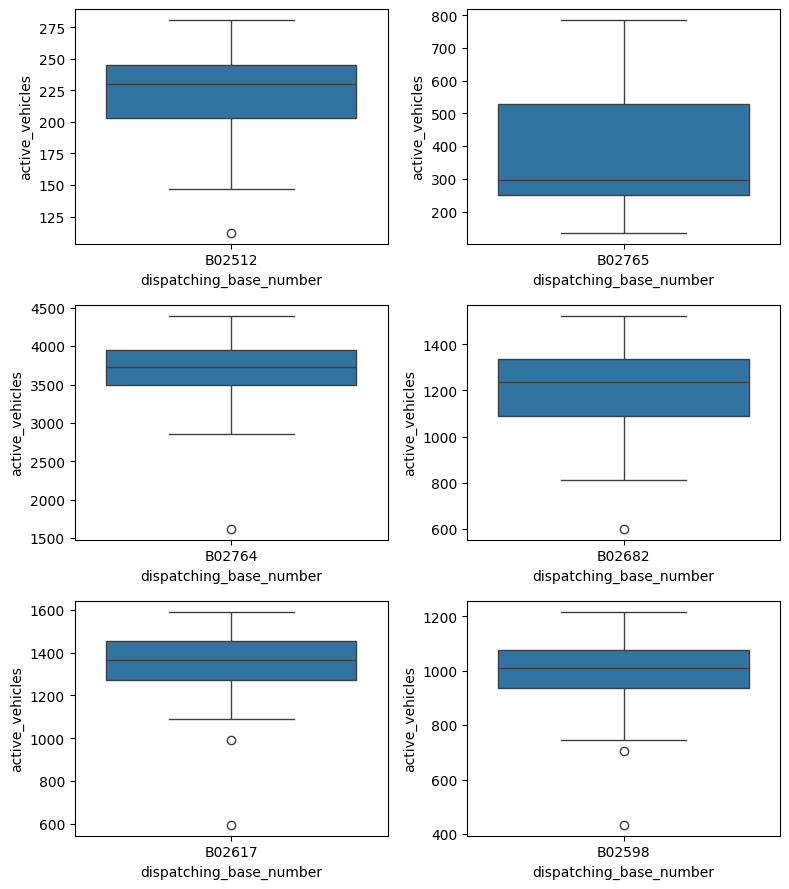

In [5]:
data_B02512 = data_uberFOIL[data_uberFOIL["dispatching_base_number"] == 'B02512']
data_B02765 = data_uberFOIL[data_uberFOIL["dispatching_base_number"] == 'B02765']
data_B02764 = data_uberFOIL[data_uberFOIL["dispatching_base_number"] == 'B02764']
data_B02682 = data_uberFOIL[data_uberFOIL["dispatching_base_number"] == 'B02682']
data_B02617 = data_uberFOIL[data_uberFOIL["dispatching_base_number"] == 'B02617']
data_B02598 = data_uberFOIL[data_uberFOIL["dispatching_base_number"] == 'B02598']

plt.figure(figsize=[8,9])

plt.subplot(321)
sns.boxplot(x='dispatching_base_number', y='active_vehicles', data=data_B02512)

plt.subplot(322)
sns.boxplot(x='dispatching_base_number', y='active_vehicles', data=data_B02765)

plt.subplot(323)
sns.boxplot(x='dispatching_base_number', y='active_vehicles', data=data_B02764)

plt.subplot(324)
sns.boxplot(x='dispatching_base_number', y='active_vehicles', data=data_B02682)

plt.subplot(325)
sns.boxplot(x='dispatching_base_number', y='active_vehicles', data=data_B02617)

plt.subplot(326)
sns.boxplot(x='dispatching_base_number', y='active_vehicles', data=data_B02598)

plt.tight_layout()
plt.show()

3

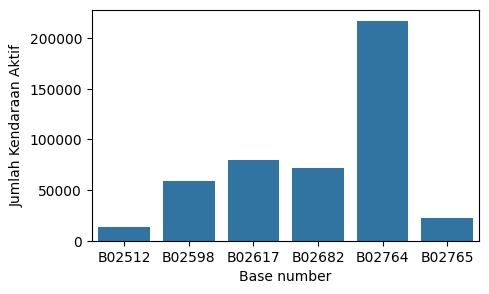

In [6]:
FOIL_basenumber = data_uberFOIL.groupby('dispatching_base_number')['active_vehicles'].sum() 

plt.figure(figsize=[5,3])
sns.barplot(x = FOIL_basenumber.index, y = FOIL_basenumber.values)
plt.xlabel('Base number')
plt.ylabel('Jumlah Kendaraan Aktif')
plt.show()

In [8]:
FOIL_basetrips = data_uberFOIL.groupby('dispatching_base_number')[['trips']].sum() 
FOIL_basetrips

,trips
dispatching_base_number,
B02512,93786
B02598,540791
B02617,725025
B02682,662509
B02764,1914449
B02765,193670


4

In [9]:
FOIL_meantrips = data_uberFOIL.groupby(['date','dispatching_base_number'])[['trips']].mean() 
FOIL_meantrips

trips
date     dispatching_base_number         
1/1/2015 B02512                    1132.0
         B02598                    6903.0
         B02617                    9537.0
         B02682                    7679.0
         B02764                   29421.0
...                                   ...
2/9/2015 B02598                    8135.0
         B02617                   10887.0
         B02682                   10209.0
         B02764                   28266.0
         B02765                    2894.0

[354 rows x 1 columns]

<Axes: xlabel='dispatching_base_number', ylabel='date'>

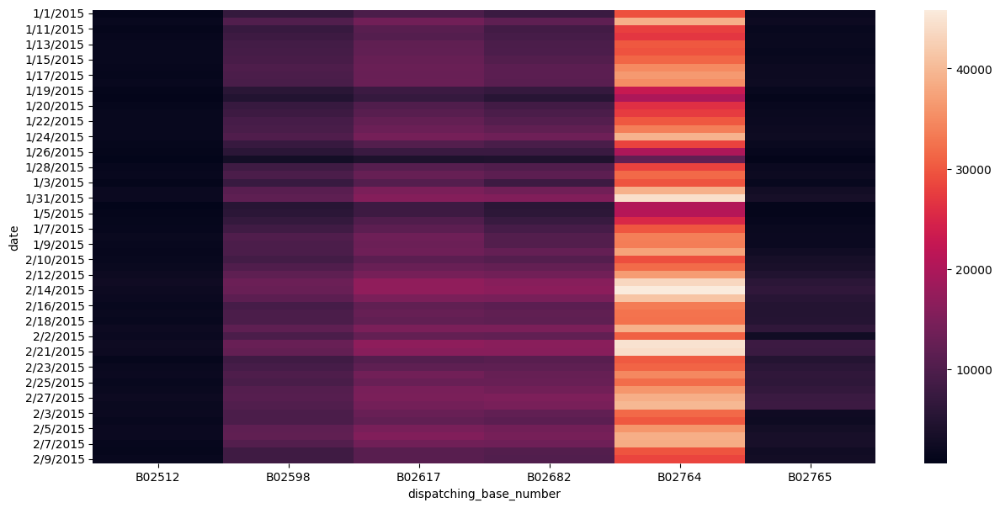

In [10]:
rata = data_uberFOIL.groupby(["date", "dispatching_base_number"])["trips"].mean()
pivot = rata.unstack()

plt.figure(figsize=(15,7))
sns.heatmap(pivot)